In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
df = pd.read_csv('esg_financial.csv')

In [3]:
df.head()

,CompanyID,CompanyName,Industry,Region,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption
0,1,Company_1,Retail,Latin America,2015,459.2,6.0,337.5,NaN,57.0,60.7,33.5,76.8,35577.4,17788.7,71154.7
1,1,Company_1,Retail,Latin America,2016,473.8,4.6,366.6,3.2,56.7,58.9,32.8,78.5,37314.7,18657.4,74629.4
2,1,Company_1,Retail,Latin America,2017,564.9,5.2,313.4,19.2,56.5,57.6,34.0,77.8,45006.4,22503.2,90012.9
3,1,Company_1,Retail,Latin America,2018,558.4,4.3,283.0,-1.1,58.0,62.3,33.4,78.3,42650.1,21325.1,85300.2
4,1,Company_1,Retail,Latin America,2019,554.5,4.9,538.1,-0.7,56.6,63.7,30.0,76.1,41799.4,20899.7,83598.8


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CompanyID          11000 non-null  int64  
 1   CompanyName        11000 non-null  object 
 2   Industry           11000 non-null  object 
 3   Region             11000 non-null  object 
 4   Year               11000 non-null  int64  
 5   Revenue            11000 non-null  float64
 6   ProfitMargin       11000 non-null  float64
 7   MarketCap          11000 non-null  float64
 8   GrowthRate         10000 non-null  float64
 9   ESG_Overall        11000 non-null  float64
 10  ESG_Environmental  11000 non-null  float64
 11  ESG_Social         11000 non-null  float64
 12  ESG_Governance     11000 non-null  float64
 13  CarbonEmissions    11000 non-null  float64
 14  WaterUsage         11000 non-null  float64
 15  EnergyConsumption  11000 non-null  float64
dtypes: float64(11), int64(

In [5]:
df.describe()

,CompanyID,Year,Revenue,ProfitMargin,MarketCap,GrowthRate,ESG_Overall,ESG_Environmental,ESG_Social,ESG_Governance,CarbonEmissions,WaterUsage,EnergyConsumption
count,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,10000.000000,11000.000000,11000.000000,11000.000000,11000.000000,1.100000e+04,1.100000e+04,1.100000e+04
mean,500.500000,2020.000000,4670.850591,10.900455,13380.622236,4.830370,54.615273,56.416991,55.660582,51.767655,1.271462e+06,5.600442e+05,1.165839e+07
std,288.688113,3.162421,9969.954369,8.758711,39922.870373,9.424787,15.893937,26.767233,23.356152,25.323370,5.067760e+06,1.565686e+06,5.095836e+07
min,1.000000,2015.000000,35.900000,-20.000000,1.800000,-36.000000,6.300000,0.000000,0.000000,0.000000,2.042200e+03,1.021100e+03,5.105500e+03
25%,250.750000,2017.000000,938.775000,5.300000,1098.525000,-1.325000,44.100000,34.700000,37.600000,30.775000,1.228530e+05,6.488467e+04,3.069161e+05
50%,500.500000,2020.000000,1902.300000,10.500000,3096.450000,4.900000,54.600000,55.600000,55.150000,52.100000,2.920734e+05,2.038805e+05,1.221745e+06
75%,750.250000,2023.000000,4342.625000,16.300000,9995.500000,11.000000,65.600000,79.000000,73.800000,73.000000,7.407311e+05,5.251880e+05,5.616437e+06
max,1000.000000,2025.000000,180810.400000,50.000000,865271.700000,38.000000,98.800000,100.000000,100.000000,100.000000,1.741047e+08,5.223142e+07,1.741047e+09


Data Cleaning and Exploration

In [6]:
df.isnull().sum()

CompanyID               0
CompanyName             0
Industry                0
Region                  0
Year                    0
Revenue                 0
ProfitMargin            0
MarketCap               0
GrowthRate           1000
ESG_Overall             0
ESG_Environmental       0
ESG_Social              0
ESG_Governance          0
CarbonEmissions         0
WaterUsage              0
EnergyConsumption       0
dtype: int64

In [7]:
# Descriptive Statistics
print("\nDescriptive Statistics of ESG Scores:")
print(df[['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']].describe())


Descriptive Statistics of ESG Scores:
        ESG_Overall  ESG_Environmental    ESG_Social  ESG_Governance
count  11000.000000       11000.000000  11000.000000    11000.000000
mean      54.615273          56.416991     55.660582       51.767655
std       15.893937          26.767233     23.356152       25.323370
min        6.300000           0.000000      0.000000        0.000000
25%       44.100000          34.700000     37.600000       30.775000
50%       54.600000          55.600000     55.150000       52.100000
75%       65.600000          79.000000     73.800000       73.000000
max       98.800000         100.000000    100.000000      100.000000


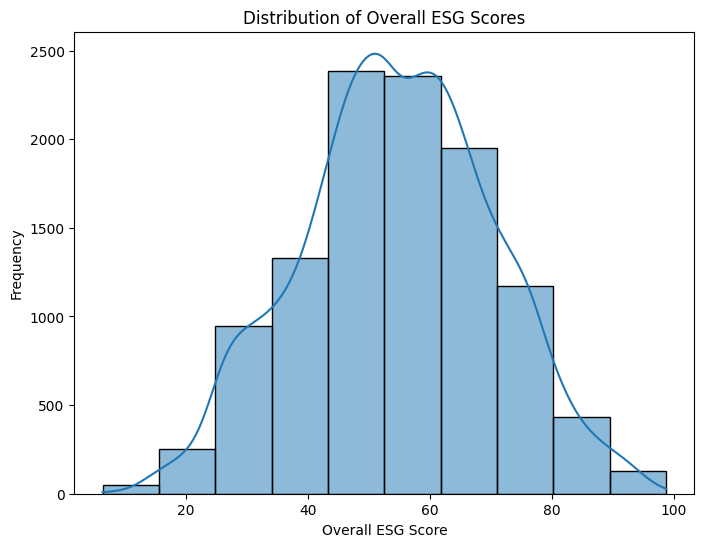

In [8]:
# Distribution of Overall ESG Scores
plt.figure(figsize=(8, 6))
sns.histplot(df['ESG_Overall'], kde=True, bins=10)  # Added bins for better visualization
plt.title('Distribution of Overall ESG Scores')
plt.xlabel('Overall ESG Score')
plt.ylabel('Frequency')
plt.show()

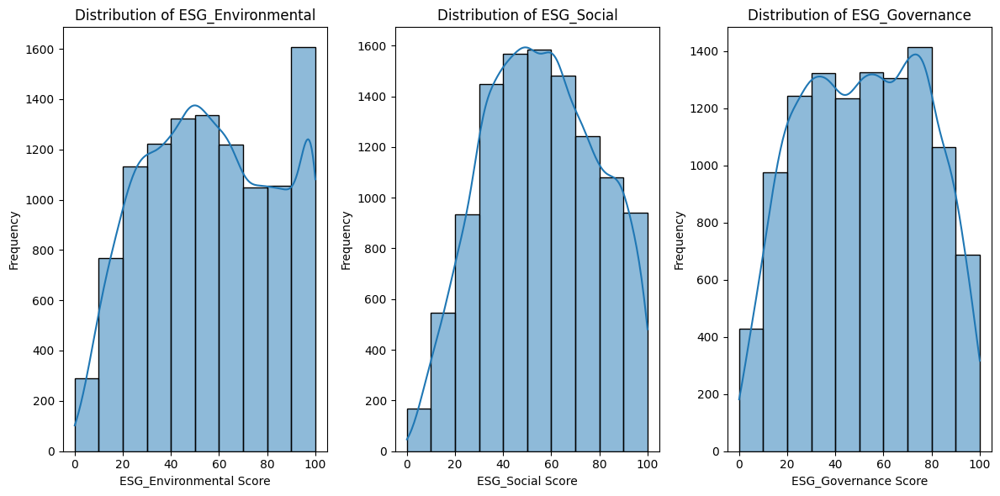

In [9]:
# Distributions of Individual ESG Pillars
esg_pillars = ['ESG_Environmental', 'ESG_Social', 'ESG_Governance']
plt.figure(figsize=(12, 6))
for i, pillar in enumerate(esg_pillars, 1):
    plt.subplot(1, 3, i)
    sns.histplot(df[pillar], kde=True, bins=10) # Added bins for better visualization
    plt.title(f'Distribution of {pillar}')
    plt.xlabel(f'{pillar} Score')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

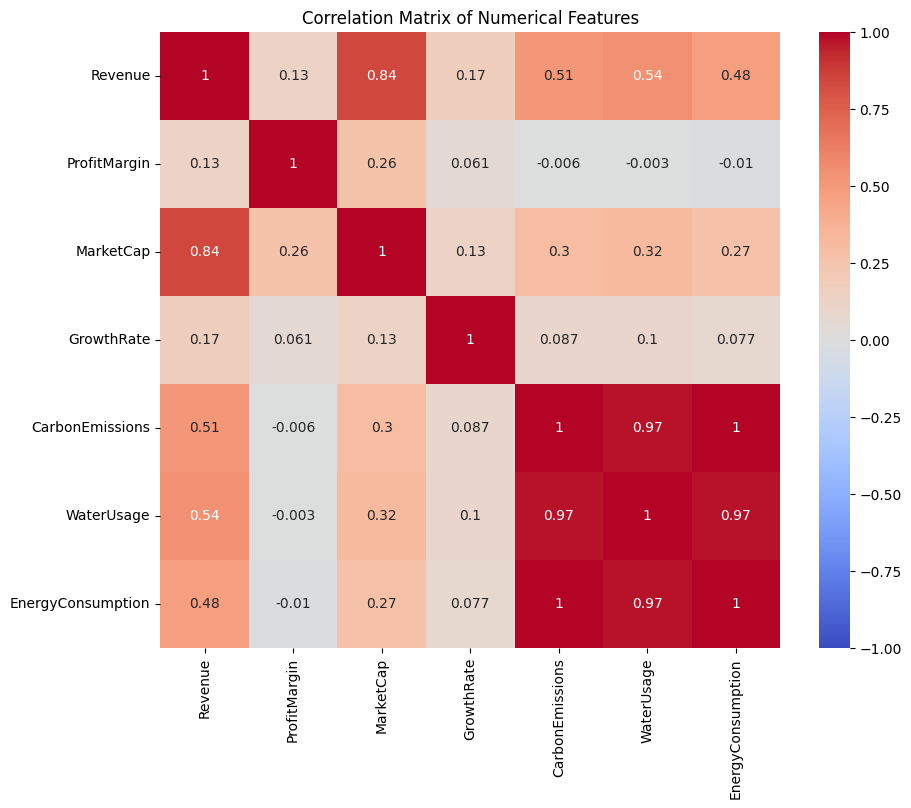

In [10]:
# Correlation Analysis of Numerical Features
numerical_features = ['Revenue', 'ProfitMargin', 'MarketCap', 'GrowthRate', 'CarbonEmissions', 'WaterUsage', 'EnergyConsumption']
correlation_matrix_numerical = df[numerical_features].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_numerical, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

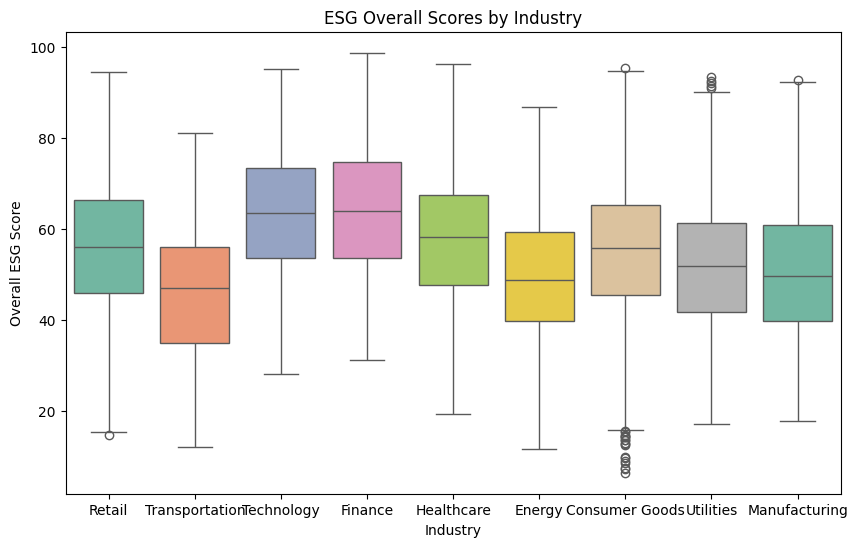

In [11]:
# Compare ESG Overall Scores Across Different Industries
plt.figure(figsize=(10, 6))
sns.boxplot(x='Industry', y='ESG_Overall', data=df, palette='Set2')
plt.title('ESG Overall Scores by Industry')
plt.xlabel('Industry')
plt.ylabel('Overall ESG Score')
plt.show()

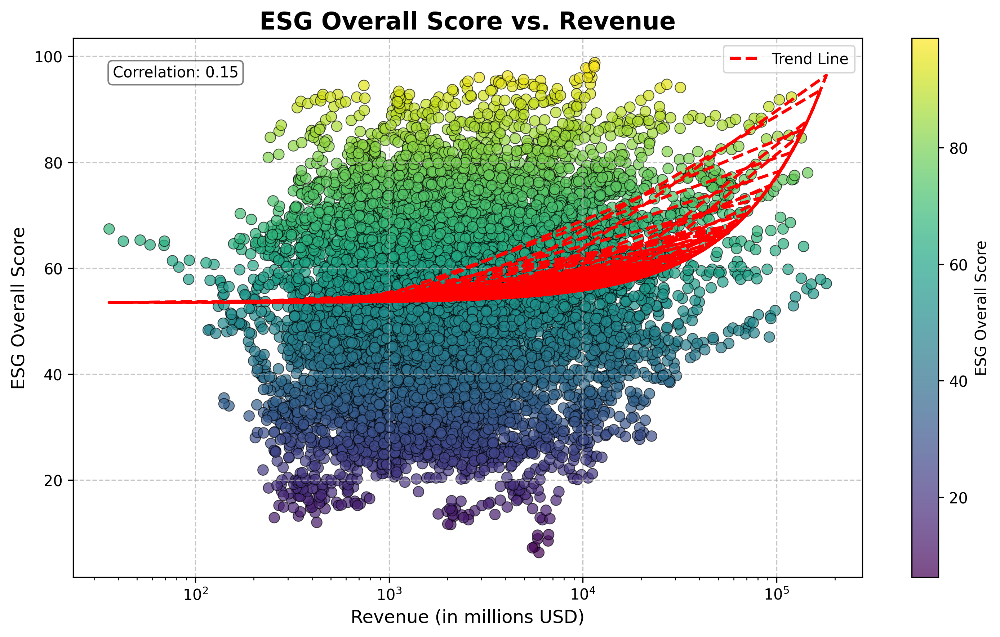

In [12]:
plt.figure(figsize=(10, 6), dpi=300)

scatter = plt.scatter(df['Revenue'], 
                      df['ESG_Overall'], 
                      c=df['ESG_Overall'], 
                      cmap='viridis', 
                      alpha=0.7, 
                      s=50, 
                      edgecolors='black', 
                      linewidth=0.5)

plt.colorbar(scatter, label='ESG Overall Score')

z = np.polyfit(df['Revenue'], df['ESG_Overall'], 1)
p = np.poly1d(z)
plt.plot(df['Revenue'], p(df['Revenue']), "r--", linewidth=2, label='Trend Line')

plt.title('ESG Overall Score vs. Revenue', fontsize=16, fontweight='bold')
plt.xlabel('Revenue (in millions USD)', fontsize=12)
plt.ylabel('ESG Overall Score', fontsize=12)
plt.xscale('log')

correlation = df['Revenue'].corr(df['ESG_Overall'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
         transform=plt.gca().transAxes, 
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

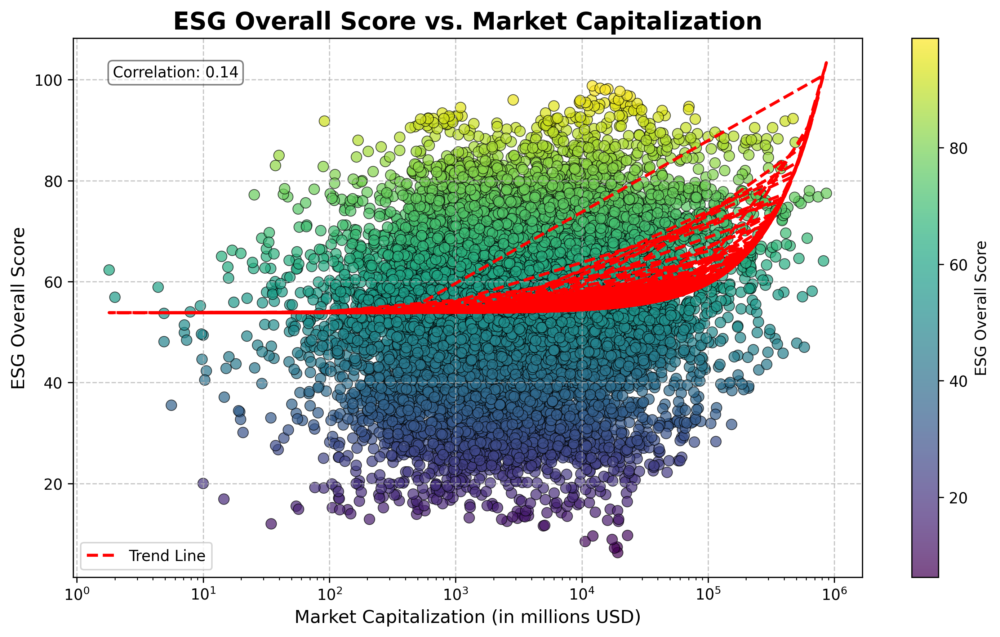

In [13]:
# ESG Overall vs. Market Capitalization
plt.figure(figsize=(10, 6), dpi=300)

scatter = plt.scatter(df['MarketCap'], 
                      df['ESG_Overall'], 
                      c=df['ESG_Overall'], 
                      cmap='viridis', 
                      alpha=0.7, 
                      s=50, 
                      edgecolors='black', 
                      linewidth=0.5)

plt.colorbar(scatter, label='ESG Overall Score')

z = np.polyfit(df['MarketCap'], df['ESG_Overall'], 1)
p = np.poly1d(z)
plt.plot(df['MarketCap'], p(df['MarketCap']), "r--", linewidth=2, label='Trend Line')

plt.title('ESG Overall Score vs. Market Capitalization', fontsize=16, fontweight='bold')
plt.xlabel('Market Capitalization (in millions USD)', fontsize=12)
plt.ylabel('ESG Overall Score', fontsize=12)
plt.xscale('log')

correlation = df['MarketCap'].corr(df['ESG_Overall'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
         transform=plt.gca().transAxes, 
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

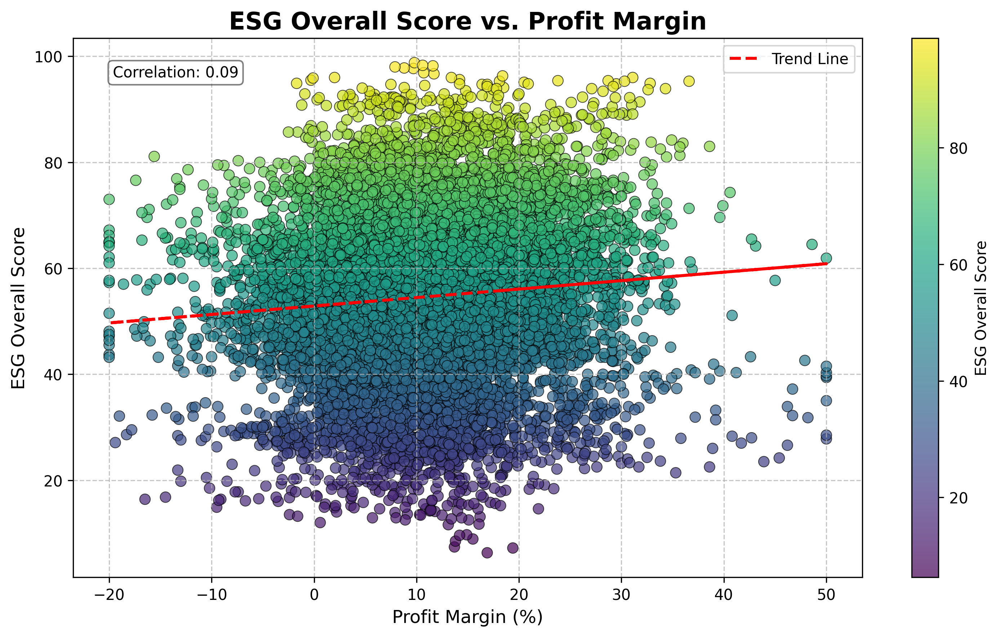

In [14]:
# ESG Overall vs. Profit Margin
plt.figure(figsize=(10, 6), dpi=300)

scatter = plt.scatter(df['ProfitMargin'], 
                      df['ESG_Overall'], 
                      c=df['ESG_Overall'], 
                      cmap='viridis', 
                      alpha=0.7, 
                      s=50, 
                      edgecolors='black', 
                      linewidth=0.5)

plt.colorbar(scatter, label='ESG Overall Score')

z = np.polyfit(df['ProfitMargin'], df['ESG_Overall'], 1)
p = np.poly1d(z)
plt.plot(df['ProfitMargin'], p(df['ProfitMargin']), "r--", linewidth=2, label='Trend Line')

plt.title('ESG Overall Score vs. Profit Margin', fontsize=16, fontweight='bold')
plt.xlabel('Profit Margin (%)', fontsize=12)
plt.ylabel('ESG Overall Score', fontsize=12)

correlation = df['ProfitMargin'].corr(df['ESG_Overall'])
plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
         transform=plt.gca().transAxes, 
         verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

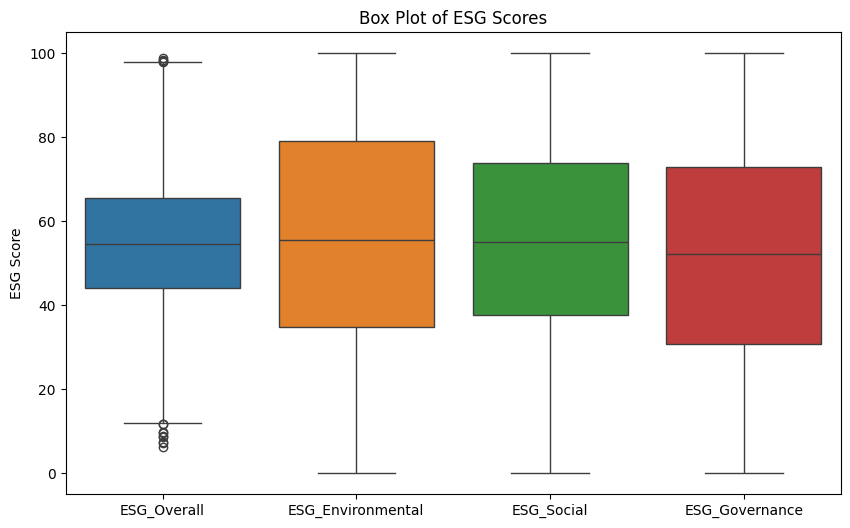

In [15]:
# Box plots of ESG Scores
plt.figure(figsize=(10, 6))
sns.boxplot(data=df[['ESG_Overall', 'ESG_Environmental', 'ESG_Social', 'ESG_Governance']])
plt.title('Box Plot of ESG Scores')
plt.ylabel('ESG Score')
plt.show()

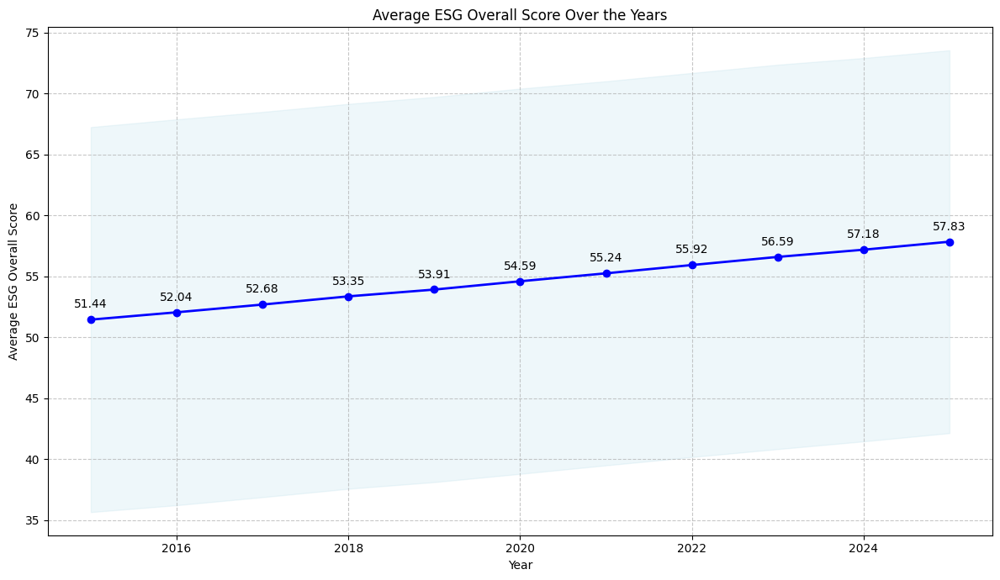

In [16]:
# ESG Overall Trend Over the Years
plt.figure(figsize=(12, 7))

avg_esg_by_year = df.groupby('Year')['ESG_Overall'].mean()
std_esg_by_year = df.groupby('Year')['ESG_Overall'].std()

plt.plot(avg_esg_by_year.index, avg_esg_by_year.values, 
         marker='o', 
         linestyle='-', 
         linewidth=2, 
         color='blue')

plt.fill_between(avg_esg_by_year.index, 
                 avg_esg_by_year.values - std_esg_by_year.values,
                 avg_esg_by_year.values + std_esg_by_year.values, 
                 alpha=0.2, 
                 color='lightblue')

plt.title('Average ESG Overall Score Over the Years')
plt.xlabel('Year')
plt.ylabel('Average ESG Overall Score')
plt.grid(True, linestyle='--', alpha=0.7)

for year, avg_score in avg_esg_by_year.items():
    plt.annotate(f'{avg_score:.2f}', 
                 (year, avg_score), 
                 xytext=(0, 10), 
                 textcoords='offset points', 
                 ha='center')

plt.tight_layout()
plt.show()